# Normalization

**Import**

In [8]:
# from second tutorial notebook (Part02)
import scanpy as sc
import pandas as pd
import scvelo as scv
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import ipywidgets as widgets

# others
import re
import os

# first tutorial
import bbknn
import diffxpy.api as dxpy
import plotly.express as px

**Read anndata matrix**

In [9]:
path_out = f'/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/data/mapping/BON/adata/'

adata_out_mm = f'{path_out}/preproc_1_starsolo_multimap_bon.h5ad'

In [10]:
# open saved data
adata = sc.read(adata_out_mm)

In [11]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells'
    layers: 'raw_counts', 'spliced', 'unspliced'

In [12]:
pwd

'/faststorage/project/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial'

In [13]:
cd '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial/'

/faststorage/project/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial


In [14]:
%run Scripts/pythonScripts.py

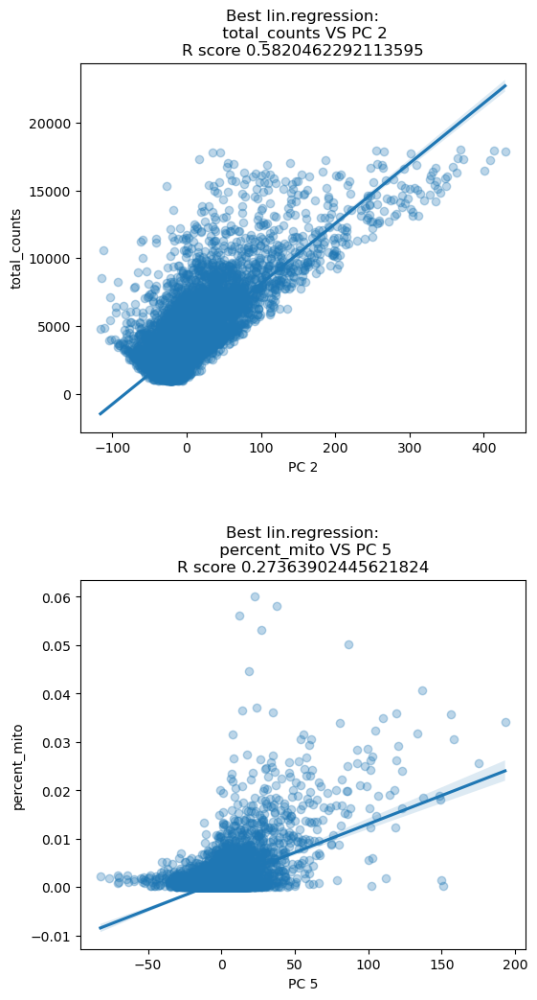

In [15]:
#from /home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial/Scripts/pythonScripts import dependentFeatures

#PCA on unnormalized data
sc.preprocessing.pca(adata, svd_solver='arpack', random_state=12345)
#Calculating correlations
dependentFeatures(adata=adata, obs_subset=['total_counts','percent_mito']) # plots PC with hight R2 to total counts and percent mito, respectively


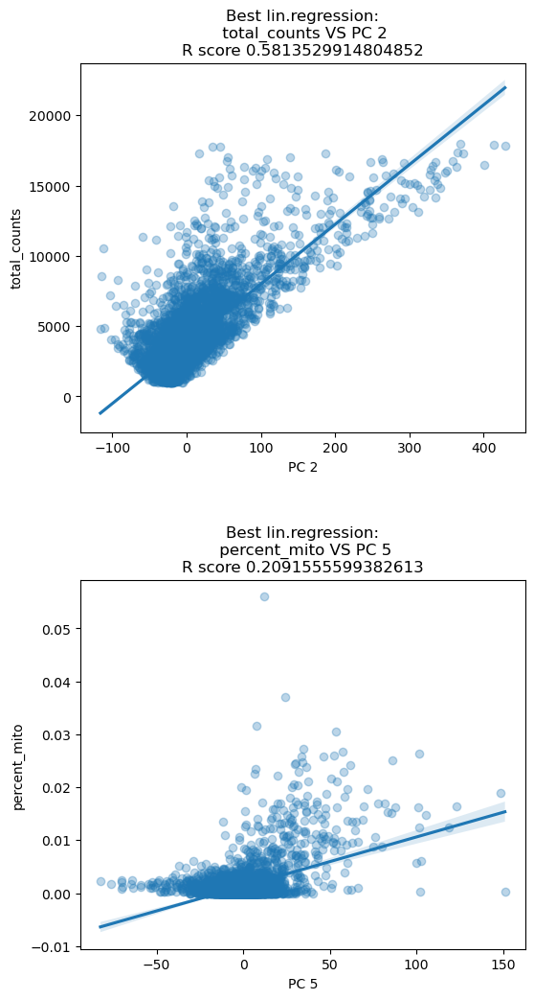

In [18]:
sc.preprocessing.pca(adata, svd_solver='arpack', random_state=12345)
dependentFeatures(adata=adata[adata.obs['DATASET'] == 'SN224'], #sample name
                  obs_subset=['total_counts','percent_mito']) #technical features

The biggest variation in the data at this point is explained by total UMI count. Normalizing with TPM should remove this bias.

In [ ]:
adata.var['chromosome']

In [ ]:
test=adata[adata.obs['DATASET']=='SN116']

In [ ]:
test

In [ ]:
adata.var_names

In [ ]:
LNC = ['LNC' in i for i in adata.var_names] #a vector with True and False to find LNC transcripts

In [ ]:
LINC = ['LINC' in i for i in adata.var_names] 

In [ ]:
adata[:,LINC]

In [ ]:
adata[:,LINC].var_names

In [ ]:
adata[:,LNC]

In [ ]:
adata[:,LNC].var_names

In [ ]:
testt=adata[adata.obs['DATASET']=='SN219']

In [ ]:
sc.preprocessing.pca(adata, svd_solver='arpack', random_state=12345)
dependentFeatures(adata=adata[adata.obs['batch'] == 'Sohni1_und'], #sample name
                  obs_subset=['total_counts','perc_mito']) #technical features

In [82]:
adata.obs['DATASET']

SN219_AAACCTGAGAAAGTGG    SN219
SN219_AAACCTGAGACCTTTG    SN219
SN219_AAACCTGAGATCCCAT    SN219
SN219_AAACCTGAGCGGCTTC    SN219
SN219_AAACCTGAGGCGCTCT    SN219
                          ...  
SN224_TTTGTCACATCCTTGC    SN224
SN224_TTTGTCAGTCTAGAGG    SN224
SN224_TTTGTCAGTGAGTGAC    SN224
SN224_TTTGTCATCCGCAGTG    SN224
SN224_TTTGTCATCGGAATCT    SN224
Name: DATASET, Length: 11852, dtype: category
Categories (2, object): ['SN219', 'SN224']

In [46]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced'

In [47]:
ss = [x for x in adata if 'LNC' in adata.var_names]

In [48]:
ss

[]

In [7]:
adata.var['feature_types'] # all feature_types are "Gene expression"

LOC100996442    Gene Expression
LOC112268260    Gene Expression
LOC105378947    Gene Expression
LOC100288069    Gene Expression
LINC01409       Gene Expression
                     ...       
ND3             Gene Expression
ND4             Gene Expression
ND5             Gene Expression
ND6             Gene Expression
CYTB            Gene Expression
Name: feature_types, Length: 24717, dtype: category
Categories (1, object): ['Gene Expression']

In [ ]:
adata.obs.head()

In [ ]:
adata.obs.tail()

In [79]:
test = adata.var['chromosome']=='MT'

In [80]:
test

LOC100996442    False
LOC729737       False
LOC107985721    False
LOC112268260    False
LOC100132287    False
                ...  
ND4L             True
ND4              True
ND5              True
ND6              True
CYTB             True
Name: chromosome, Length: 27335, dtype: bool

In [18]:
test_adata = [x for x in adata.var_names if adata.var['chromosome']=='MT']

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [17]:
test_adata

[]

In [29]:
adata.layers

Layers with keys: raw_counts, spliced, unspliced

In [30]:
adata.to_df(layer="raw_counts")

,LOC100996442,LOC112268260,LOC105378947,LOC100288069,LINC01409,LINC01128,LOC284600,SAMD11,NOC2L,HES4,...,ND1,COX1,COX2,ATP6,COX3,ND3,ND4,ND5,ND6,CYTB
SN116_AAACCTGCACCGGAAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGCAGACGCCT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGGTCCCGACA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGGTCTCAACA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGTCGGCGCAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN143_TTTGTCACATGCCTTC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCAGTGCAACGA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCAGTGCAGTAG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCATCTCTGTCG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [57]:
# TPM normalization. 
sc.pp.normalize_per_cell(adata)

In [16]:
adata.to_df()

,LOC100996442,LOC112268260,LOC105378947,LOC100288069,LINC01409,LINC01128,LOC284600,SAMD11,NOC2L,HES4,...,ND1,COX1,COX2,ATP6,COX3,ND3,ND4,ND5,ND6,CYTB
SN116_AAACCTGCACCGGAAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGCAGACGCCT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGGTCCCGACA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,...,0.000000,0.0,0.000000,0.803455,2.410364,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGGTCTCAACA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGTCGGCGCAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN143_TTTGTCACATGCCTTC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,...,0.684408,0.0,0.000000,0.342204,1.026612,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCAGTGCAACGA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.48103,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCAGTGCAGTAG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCATCTCTGTCG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


In [58]:
# matrix logarithmization (ln(x+1))
sc.pp.log1p(adata)

In [18]:
# to see counts
adata.to_df()

,LOC100996442,LOC112268260,LOC105378947,LOC100288069,LINC01409,LINC01128,LOC284600,SAMD11,NOC2L,HES4,...,ND1,COX1,COX2,ATP6,COX3,ND3,ND4,ND5,ND6,CYTB
SN116_AAACCTGCACCGGAAA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGCAGACGCCT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGGTCCCGACA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.00000,0.589704,1.226819,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGGTCTCAACA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN116_AAACCTGTCGGCGCAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN143_TTTGTCACATGCCTTC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.521414,0.0,0.00000,0.294313,0.706365,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCAGTGCAACGA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.392738,0.0,0.0,...,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCAGTGCAGTAG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
SN143_TTTGTCATCTCTGTCG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


In [59]:
# most variable genes, True or False
sc.pp.highly_variable_genes(adata, n_top_genes=15000)

In [60]:
# scale, standardized with mean 0 and variance 1
sc.pp.scale(adata)
adata.layers['scaled_counts'] = adata.X.copy()

In [21]:
adata.to_df()

,LOC100996442,LOC112268260,LOC105378947,LOC100288069,LINC01409,LINC01128,LOC284600,SAMD11,NOC2L,HES4,...,ND1,COX1,COX2,ATP6,COX3,ND3,ND4,ND5,ND6,CYTB
SN116_AAACCTGCACCGGAAA,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,-0.100330,-0.13976,-0.070454,...,-0.477928,-0.320314,-0.342312,-0.363158,-0.544257,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782
SN116_AAACCTGCAGACGCCT,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,-0.100330,-0.13976,-0.070454,...,-0.477928,-0.320314,-0.342312,-0.363158,-0.544257,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782
SN116_AAACCTGGTCCCGACA,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,-0.100330,-0.13976,-0.070454,...,-0.477928,-0.320314,-0.342312,1.715747,1.258343,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782
SN116_AAACCTGGTCTCAACA,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,-0.100330,-0.13976,-0.070454,...,-0.477928,-0.320314,-0.342312,-0.363158,-0.544257,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782
SN116_AAACCTGTCGGCGCAT,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,-0.100330,-0.13976,-0.070454,...,-0.477928,-0.320314,-0.342312,-0.363158,-0.544257,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN143_TTTGTCACATGCCTTC,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,-0.100330,-0.13976,-0.070454,...,0.431126,-0.320314,-0.342312,0.674394,0.493626,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782
SN143_TTTGTCAGTGCAACGA,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,6.162318,-0.13976,-0.070454,...,-0.477928,-0.320314,-0.342312,-0.363158,-0.544257,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782
SN143_TTTGTCAGTGCAGTAG,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,-0.100330,-0.13976,-0.070454,...,-0.477928,-0.320314,-0.342312,-0.363158,-0.544257,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782
SN143_TTTGTCATCTCTGTCG,-0.200025,-0.131292,-0.070652,-0.146392,-0.12295,-0.091897,-0.13013,-0.100330,-0.13976,-0.070454,...,-0.477928,-0.320314,-0.342312,-0.363158,-0.544257,-0.093679,-0.251779,-0.153068,-0.071617,-0.208782


In [61]:
adata.var

,gene_ids,feature_types,chromosome,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
LOC100996442,LOC100996442,Gene Expression,1,2563,True,0.132876,0.258873,0.394049,0.094128,0.243078
LOC729737,LOC729737,Gene Expression,1,688,False,0.020337,-0.264949,-1.933276,0.015793,0.085067
LOC107985721,LOC107985721,Gene Expression,1,54,False,0.001564,-0.315143,-2.156283,0.001212,0.023720
LOC112268260,LOC112268260,Gene Expression,1,664,False,0.027335,-0.005410,-0.780153,0.020049,0.105767
LOC100132287,LOC100132287,Gene Expression,1,418,False,0.009244,-0.343487,-2.282214,0.007437,0.053393
...,...,...,...,...,...,...,...,...,...,...
ND4L,ND4L,Gene Expression,MT,292,False,0.013683,-0.030918,-0.893481,0.009974,0.075701
ND4,ND4,Gene Expression,MT,2280,True,0.212017,0.959985,2.847046,0.129763,0.335761
ND5,ND5,Gene Expression,MT,647,False,0.038060,0.166519,-0.016277,0.026533,0.131905
ND6,ND6,Gene Expression,MT,50,False,0.002511,0.076747,-0.415129,0.001769,0.033423


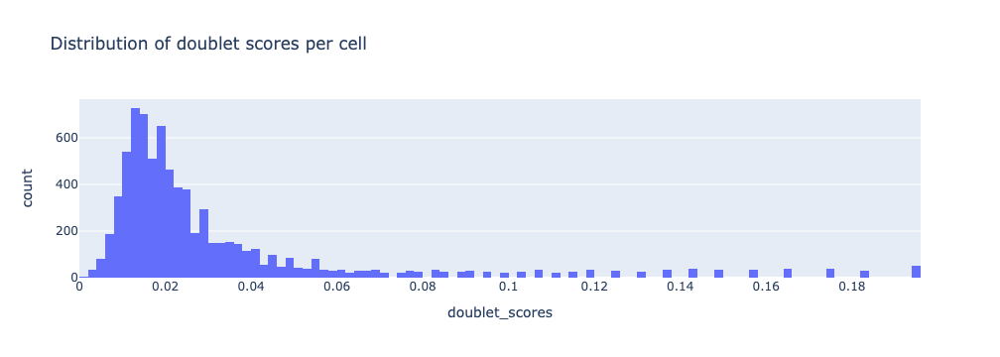

In [64]:
fig = px.histogram(adata.obs, x='doublet_scores', title='Distribution of doublet scores per cell')
fig.show()

In [62]:
adata.layers

Layers with keys: raw_counts, spliced, unspliced, scaled_counts

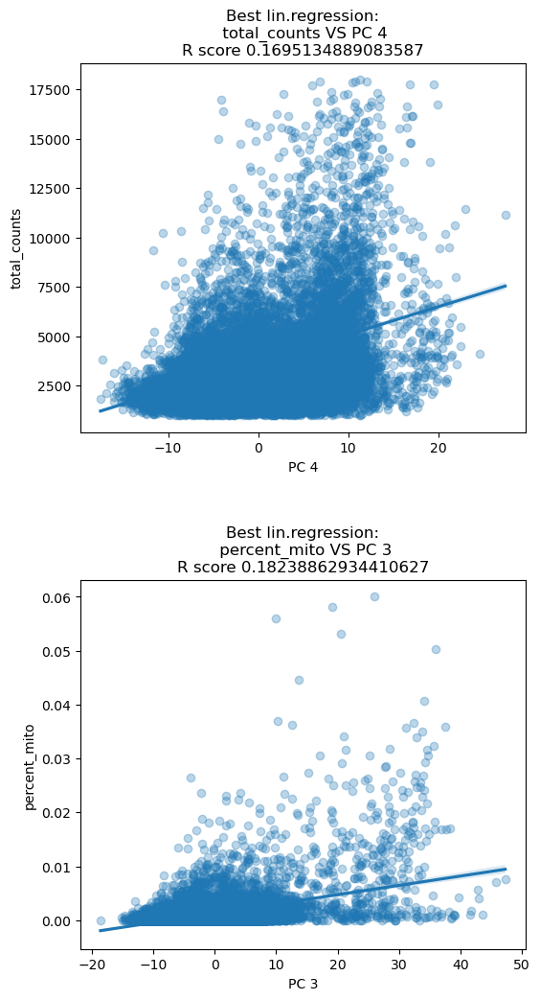

In [63]:
#PCA on normalized data
sc.preprocessing.pca(adata, svd_solver='arpack', random_state=12345)
#Calculating correlations
dependentFeatures(adata=adata, obs_subset=['total_counts','percent_mito'])

Now the correlation isn't strong.

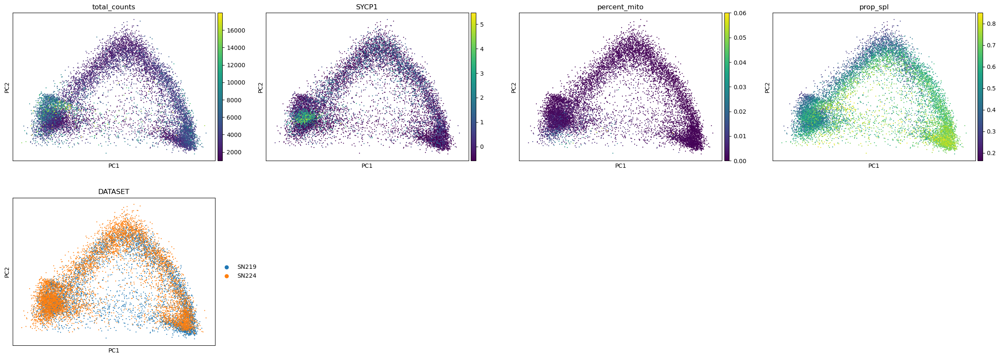

In [64]:
sc.pl.pca(adata, color=['total_counts', 'SYCP1', 'percent_mito', 'prop_spl', 'DATASET'])

Luckily the samples overlap, so they can be analyzed combined

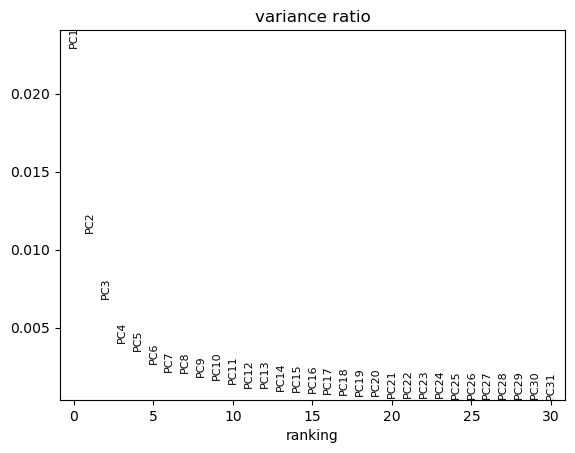

In [65]:
sc.plotting.pca_variance_ratio(adata) # small variance means it probably models noice in the data

Keep the PCs with the most variance, e.g. up to PC15

In [66]:
#sc.pp.neighbors(adata, n_pcs=15, random_state=12345) # use only for data with one single sample
bbknn.bbknn(adata, n_pcs=15)

In [67]:
sc.tools.umap(adata, random_state=54321)

In [69]:
sc.tools.umap(adata, random_state=54321, n_components=3) # 3 components for 3D projection

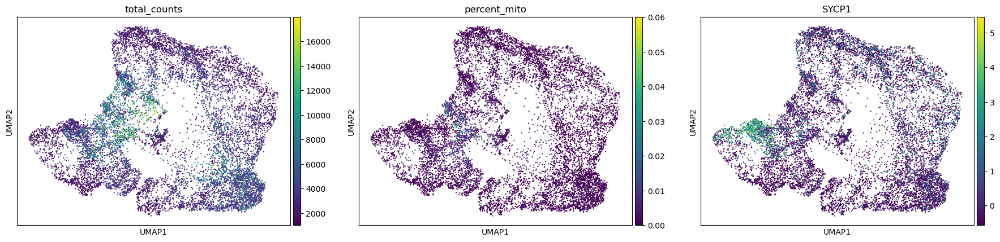

In [70]:
sc.plotting.umap(adata, color=['total_counts','percent_mito', 'SYCP1']) # 3 components for 3D projection

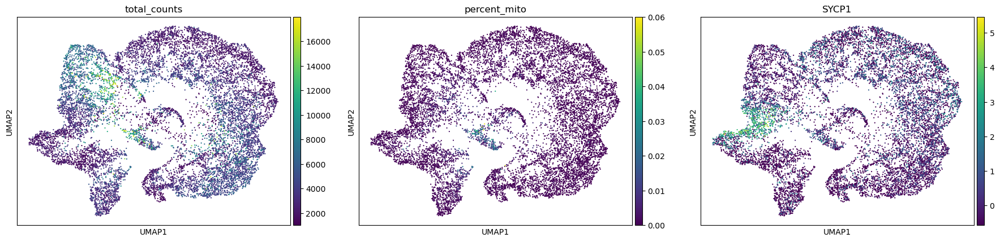

In [68]:
sc.plotting.umap(adata, color=['total_counts','percent_mito', 'SYCP1']) # 2D

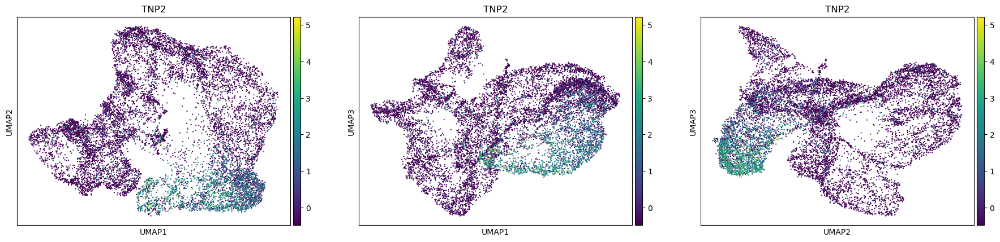

In [72]:
sc.plotting.umap(adata, color=['TNP2'], components=['1,2','1,3','2,3']) 

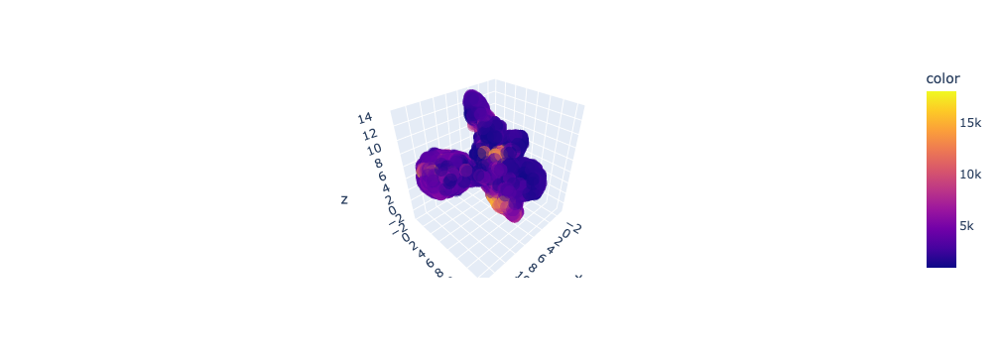

In [71]:
X = adata.obsm['X_umap']
fig = px.scatter_3d(adata.obsm, x=X[:,0], y=X[:,1], z=X[:,2], color=adata.obs['total_counts'], opacity=.5)
fig.show()

In [73]:
sc.plotting.umap(adata, color=['TNP2'], projection='3d', components=['1,2,3'] 

SyntaxError: incomplete input (3611962618.py, line 1)

In [74]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivities'

In [36]:
print( list( adata.obs.columns ) )

['DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts']


In [65]:
print( list( adata.var.columns ) )

['gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std']


In [59]:
print( list( adata.obs['batch'] ) )


NameError: name 'sort' is not defined